<img src="https://storage.googleapis.com/kaggle-datasets-images/681625/1196732/a1d8dfe666ca94f660058a2f56a5639d/dataset-cover.png?t=2020-05-29-09-01-54">

In [1]:
# !pip install albumentations --upgrade

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.7/41.7 kB 2.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.0/66.0 kB 4.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 290.6/290.6 kB 17.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 632.7/632.7 kB 34.4 MB/s eta 0:00:00
  Attempting uninstall: albucore
    Found existing installation: albucore 0.0.19
    Uninstalling albucore-0.0.19:
      Successfully uninstalled albucore-0.0.19
  Attempting uninstall: albumentations
    Found existing installation: albumentations 1.4.20
    Uninstalling albumentations-1.4.20:
      Successfully uninstalled albumentations-1.4.20


In [2]:
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
import tensorflow as tf
import cv2
import random
from PIL import ImageColor
import matplotlib.patches as mpatches

plt.style.use("dark_background")

In [3]:
def load_img(filename, channels=3):
    raw = tf.io.read_file(filename)
    try:
        image = tf.io.decode_image(raw, channels=channels)
    except:
        image = tf.convert_to_tensor(cv2.imread(filename, channels))
    return image

# Gathering file paths

In [4]:
source_path = "/kaggle/input/"
dst_path = "/kaggle/working/"

img_paths = [source_path + "modified-uavid-dataset/modified_uavid_dataset/train_data/Images",
             source_path + "modified-uavid-dataset/modified_uavid_dataset/val_data/Images",
             source_path + "semantic-segmentation-drone-dataset/classes_dataset/classes_dataset/original_images",
             source_path + "semantic-segmentation-of-aerial-imagery/Semantic segmentation dataset/Tile 1/images",
             source_path + "semantic-segmentation-of-aerial-imagery/Semantic segmentation dataset/Tile 2/images",
             source_path + "semantic-segmentation-of-aerial-imagery/Semantic segmentation dataset/Tile 3/images",
             source_path + "semantic-segmentation-of-aerial-imagery/Semantic segmentation dataset/Tile 4/images",
             source_path + "semantic-segmentation-of-aerial-imagery/Semantic segmentation dataset/Tile 5/images",
             source_path + "semantic-segmentation-of-aerial-imagery/Semantic segmentation dataset/Tile 6/images",
             source_path + "semantic-segmentation-of-aerial-imagery/Semantic segmentation dataset/Tile 7/images",
             source_path + "semantic-segmentation-of-aerial-imagery/Semantic segmentation dataset/Tile 8/images",
             source_path + "satellite-image-and-mask/train_image",
             source_path + "gaofen-satellite-images-five-billion-pixels/Image__8bit_NirRGB",
             source_path + "/urban-segmentation-isprs/Potsdam/Images",
             source_path + "/urban-segmentation-isprs/Vaihingen/Images",
             source_path + "swiss-drone-and-okutama-drone-datasets/images/train",
             source_path + "swiss-drone-and-okutama-drone-datasets/images/test",
             source_path + "swiss-drone-and-okutama-drone-datasets/images/val",
            ]

msk_paths = [source_path + "modified-uavid-dataset/modified_uavid_dataset/train_data/Labels",
             source_path + "modified-uavid-dataset/modified_uavid_dataset/val_data/Labels",
             source_path + "semantic-segmentation-drone-dataset/classes_dataset/classes_dataset/label_images_semantic",
             source_path + "semantic-segmentation-of-aerial-imagery/Semantic segmentation dataset/Tile 1/masks",
             source_path + "semantic-segmentation-of-aerial-imagery/Semantic segmentation dataset/Tile 2/masks",
             source_path + "semantic-segmentation-of-aerial-imagery/Semantic segmentation dataset/Tile 3/masks",
             source_path + "semantic-segmentation-of-aerial-imagery/Semantic segmentation dataset/Tile 4/masks",
             source_path + "semantic-segmentation-of-aerial-imagery/Semantic segmentation dataset/Tile 5/masks",
             source_path + "semantic-segmentation-of-aerial-imagery/Semantic segmentation dataset/Tile 6/masks",
             source_path + "semantic-segmentation-of-aerial-imagery/Semantic segmentation dataset/Tile 7/masks",
             source_path + "semantic-segmentation-of-aerial-imagery/Semantic segmentation dataset/Tile 8/masks",
             source_path + "satellite-image-and-mask/train_mask",
             source_path + "gaofen-satellite-images-five-billion-pixels/Annotation__color",
             source_path + "urban-segmentation-isprs/Potsdam/Labels",
             source_path + "urban-segmentation-isprs/Vaihingen/Labels",
             source_path + "swiss-drone-and-okutama-drone-datasets/ground_truth/train",
             source_path + "swiss-drone-and-okutama-drone-datasets/ground_truth/test",
             source_path + "swiss-drone-and-okutama-drone-datasets/ground_truth/val",
            ]

dt_abb = ["MUD", "MUD", "SSDD", "SSAI", "SSAI", "SSAI", "SSAI", "SSAI", "SSAI", "SSAI", "SSAI", "SIM", "FBP", "ISPRS", "ISPRS", "SO", "SO", "SO"]

In [5]:
df_files = pd.DataFrame()
imgs, msks = [], []
for i, m, a in zip(img_paths, msk_paths, dt_abb):
    img_list = os.listdir(i)
    msk_list = os.listdir(m)
    img_list.sort()
    msk_list.sort()
    df_aux = pd.DataFrame(data={"filename_image": img_list, "filename_mask": msk_list})
    df_aux["filename_image"] = df_aux["filename_image"].apply(lambda x: i+'/'+x)
    df_aux["filename_mask"] = df_aux["filename_mask"].apply(lambda x: m+'/'+x)
    df_aux["dataset_abb"] = a
    df_files = pd.concat([df_files, df_aux], ignore_index=True)
df_files

,filename_image,filename_mask,dataset_abb
0,/kaggle/input/modified-uavid-dataset/modified_...,/kaggle/input/modified-uavid-dataset/modified_...,MUD
1,/kaggle/input/modified-uavid-dataset/modified_...,/kaggle/input/modified-uavid-dataset/modified_...,MUD
2,/kaggle/input/modified-uavid-dataset/modified_...,/kaggle/input/modified-uavid-dataset/modified_...,MUD
3,/kaggle/input/modified-uavid-dataset/modified_...,/kaggle/input/modified-uavid-dataset/modified_...,MUD
4,/kaggle/input/modified-uavid-dataset/modified_...,/kaggle/input/modified-uavid-dataset/modified_...,MUD
...,...,...,...
1209,/kaggle/input/swiss-drone-and-okutama-drone-da...,/kaggle/input/swiss-drone-and-okutama-drone-da...,SO
1210,/kaggle/input/swiss-drone-and-okutama-drone-da...,/kaggle/input/swiss-drone-and-okutama-drone-da...,SO
1211,/kaggle/input/swiss-drone-and-okutama-drone-da...,/kaggle/input/swiss-drone-and-okutama-drone-da...,SO
1212,/kaggle/input/swiss-drone-and-okutama-drone-da...,/kaggle/input/swiss-drone-and-okutama-drone-da...,SO


# Normalizing masks colors

In [6]:
from tensorflow.image import resize_with_pad, resize

def get_data(df, dataset=None):
    if dataset is None:
        num_images = len(df)
        random_idx = random.randint(0, num_images - 1)
        filename_img, filename_mask, dt_abb = df.loc[random_idx]
    else:
        df_aux = df_files[df_files["dataset_abb"] == dataset]
        num_images = len(df_aux)
        random_idx = random.randint(0, num_images - 1)
        filename_img, filename_mask, dt_abb = df_aux.iloc[random_idx]
        
    image = load_img(filename_img, 3)
    mask = load_img(filename_mask, 3)
    return image, mask, dt_abb

def norm_colors(mask, colors, colors_conv):
    boolean_all = tf.zeros(shape=[tf.shape(mask)[0], tf.shape(mask)[1]], dtype=tf.bool)
    for x, y in zip(colors, colors_conv):
        boolean_mask = tf.reduce_all(tf.equal(mask, tf.constant(x, dtype=tf.uint8)), axis=-1)
        boolean_all = tf.logical_or(boolean_all, boolean_mask)
        R = tf.where(boolean_mask, tf.constant(y, dtype=tf.uint8)[0], mask[..., 0])
        G = tf.where(boolean_mask, tf.constant(y, dtype=tf.uint8)[1], mask[..., 1])
        B = tf.where(boolean_mask, tf.constant(y, dtype=tf.uint8)[2], mask[..., 2])
        mask = tf.stack([R,G,B], axis=-1)
        
    unlabeled = tf.constant((0, 0, 0), dtype=tf.uint8)
    R = tf.where(boolean_all, mask[..., 0], unlabeled[0])
    G = tf.where(boolean_all, mask[..., 1], unlabeled[1])
    B = tf.where(boolean_all, mask[..., 2], unlabeled[2])
    mask = tf.stack([R,G,B], axis=-1)
    return mask

def get_patches(mask, list_colors, list_classes):
    colors, _ = tf.raw_ops.UniqueV2(x=tf.reshape(mask, (-1, 3)), axis=[0])
    colors = colors.numpy()

    patches = []
    for color in colors:
        idx_classes = np.where(list_colors == tuple(color))[0]
        color = tuple(color/255)
        if len(idx_classes) > 0:
            obj = list_classes[idx_classes[0]]
            patches.append(mpatches.Patch(color=color, label=obj))
    return patches

def resize_image(img, mask, major_size, padding=True):
    if padding:
        img = resize_with_pad(img, target_height=major_size, target_width=major_size)
        mask = resize_with_pad(mask, target_height=major_size, target_width=major_size)
    else:
        img_shape = tf.shape(img)[0:2]
        ar = img_shape[1]/img_shape[0] #W/H
        img = resize(img, size=(major_size, major_size*ar) if img_shape[0] > img_shape[1] else (major_size/ar, major_size))
        mask = resize(mask, size=(major_size, major_size*ar) if img_shape[0] > img_shape[1] else (major_size/ar, major_size))
    return tf.cast(img, dtype=tf.uint8), tf.cast(mask, dtype=tf.uint8)

def plot_sample(img, mask, df_colors, num_img=1, num_cols=2, ind=0, norm=False, df_colors_conv=None, size_img=None):
    plt.subplot(num_img, num_cols, ind+1)
    plt.imshow(img)
    plt.tick_params(bottom=False, top=False, left=False, right=False, labelbottom=False, labelleft=False)
    plt.title("Aerial image", fontsize=8)

    plt.subplot(num_img, num_cols, ind+2)
    plt.imshow(mask)
    plt.tick_params(bottom=False, top=False, left=False, right=False, labelbottom=False, labelleft=False)
    patches = get_patches(mask, df_colors["Color_RGB"], df_colors["Classes"])
    plt.legend(handles=patches, fontsize=6.5, facecolor='white', labelcolor='black')
    plt.title("Original mask", fontsize=8)

    if norm == True:
        mask_norm = norm_colors(mask, df_colors["Color_RGB"], df_colors["Convertion"])
        plt.subplot(num_img, num_cols, ind+3)
        plt.imshow(mask_norm)
        plt.tick_params(bottom=False, top=False, left=False, right=False, labelbottom=False, labelleft=False)
        patches = get_patches(mask_norm, df_colors_conv["Color_RGB"], df_colors_conv["Classes"])
        plt.legend(handles=patches, fontsize=6.5, facecolor='white', labelcolor='black')
        plt.title("Re-Colorized mask", fontsize=8)
    return

def plot_samples(dataset, df_colors, df_files, num_img=4, w_disp=10, h_disp=18, norm=False, df_colors_conv=None, size_img=None):
    num_cols = 2
    if norm == True:
        num_cols = 3
    
    plt.subplots(num_img, num_cols, figsize=(w_disp, h_disp))
    
    for i in range(num_img):
        df_colors_ = df_colors.copy()
        ind = i*num_cols
        img, mask, abb = get_data(df_files, dataset=dataset)
        
        if size_img is not None:
            img, mask = resize_image(img, mask, size_img)

        if abb == "SO":
            mask = norm_colors(mask, df_colors_["Color_RGB"], df_colors["Re-Color"])
            df_colors_["Color_RGB"] = df_colors_["Re-Color"]
            
        if abb == "ISPRS":
            img = img[..., ::-1]
            
        plot_sample(img, mask, df_colors_, num_img, num_cols, ind, norm, df_colors_conv)
    return

size = 1024

## Semantic segmentation of aerial imagery - Baseline

In [7]:
seg_classes = ["Building",
            "Land",
            "Road",
            "Vegetation",
            "Water",
            "Object",
            "Unlabeled",
            "Unlabeled",
           ]

color_hex = ["#3C1098",
             "#8429F6",
             "#6EC1E4",
             "#FEDD3A",
             "#E2A929",
             "#E8623C",
             "#000000",
             "#9B9B9B",
            ]

color_rgb = [tuple(np.array(ImageColor.getcolor(hex_, "RGB"))) for hex_ in color_hex]
SSAI_colors = pd.DataFrame(data={"Classes": seg_classes, "Color_HEX": color_hex, "Color_RGB": color_rgb})
SSAI_colors

,Classes,Color_HEX,Color_RGB
0,Building,#3C1098,"(60, 16, 152)"
1,Land,#8429F6,"(132, 41, 246)"
2,Road,#6EC1E4,"(110, 193, 228)"
3,Vegetation,#FEDD3A,"(254, 221, 58)"
4,Water,#E2A929,"(226, 169, 41)"
5,Object,#E8623C,"(232, 98, 60)"
6,Unlabeled,#000000,"(0, 0, 0)"
7,Unlabeled,#9B9B9B,"(155, 155, 155)"


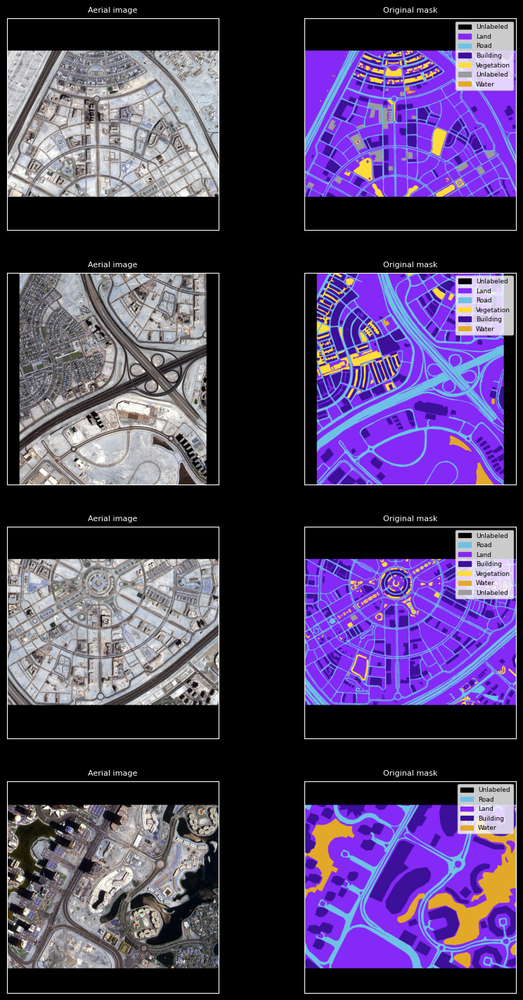

In [8]:
plot_samples("SSAI", SSAI_colors, df_files, size_img=size)

In [9]:
def get_color_baseline(cat):
    return SSAI_colors.loc[SSAI_colors["Classes"] == cat, "Color_RGB"].values[0]

def get_classes_baseline(color):
    return SSAI_colors.loc[SSAI_colors["Color_RGB"] == color, "Classes"].values[0]

SSAI_colors["Convertion"] = [get_color_baseline("Building"),
                             get_color_baseline("Land"),
                             get_color_baseline("Road"),
                             get_color_baseline("Vegetation"),
                             get_color_baseline("Water"),
                             get_color_baseline("Object"),
                             get_color_baseline("Unlabeled"),
                             get_color_baseline("Unlabeled")]
SSAI_colors

,Classes,Color_HEX,Color_RGB,Convertion
0,Building,#3C1098,"(60, 16, 152)","(60, 16, 152)"
1,Land,#8429F6,"(132, 41, 246)","(132, 41, 246)"
2,Road,#6EC1E4,"(110, 193, 228)","(110, 193, 228)"
3,Vegetation,#FEDD3A,"(254, 221, 58)","(254, 221, 58)"
4,Water,#E2A929,"(226, 169, 41)","(226, 169, 41)"
5,Object,#E8623C,"(232, 98, 60)","(232, 98, 60)"
6,Unlabeled,#000000,"(0, 0, 0)","(0, 0, 0)"
7,Unlabeled,#9B9B9B,"(155, 155, 155)","(0, 0, 0)"


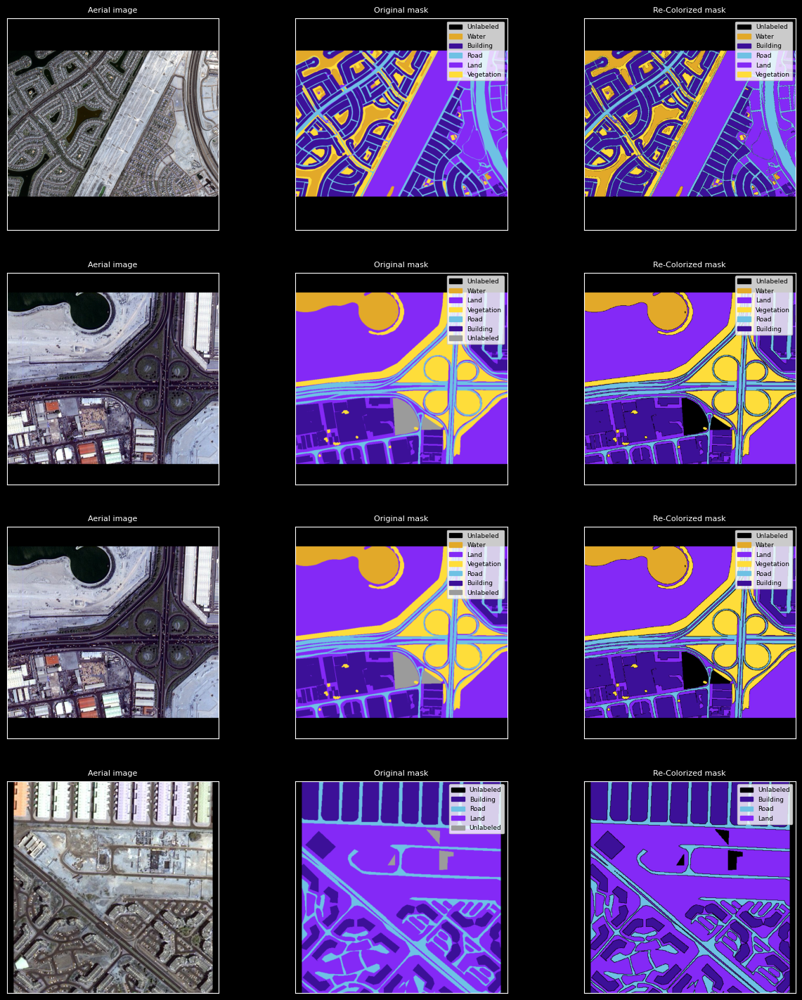

In [10]:
plot_samples("SSAI", SSAI_colors, df_files, norm=True, df_colors_conv=SSAI_colors, w_disp=15, size_img=size)

## Modified UAVid Dataset

In [11]:
seg_classes = ["Background clutter",
            "Building",
            "Road",
            "Tree",
            "Low vegetation",
            "Moving car",
            "Static car",
            "Human"]


color_rgb = [(0, 0, 0),
             (128, 0, 0),
             (128, 64, 128),
             (0, 128, 0),
             (128, 128, 0),
             (64, 0, 128),
             (192, 0, 192),
             (64, 64, 0)]

MUD_colors = pd.DataFrame(data={"Classes": seg_classes, "Color_RGB": [tuple(np.array(color)) for color in color_rgb]})
MUD_colors

,Classes,Color_RGB
0,Background clutter,"(0, 0, 0)"
1,Building,"(128, 0, 0)"
2,Road,"(128, 64, 128)"
3,Tree,"(0, 128, 0)"
4,Low vegetation,"(128, 128, 0)"
5,Moving car,"(64, 0, 128)"
6,Static car,"(192, 0, 192)"
7,Human,"(64, 64, 0)"


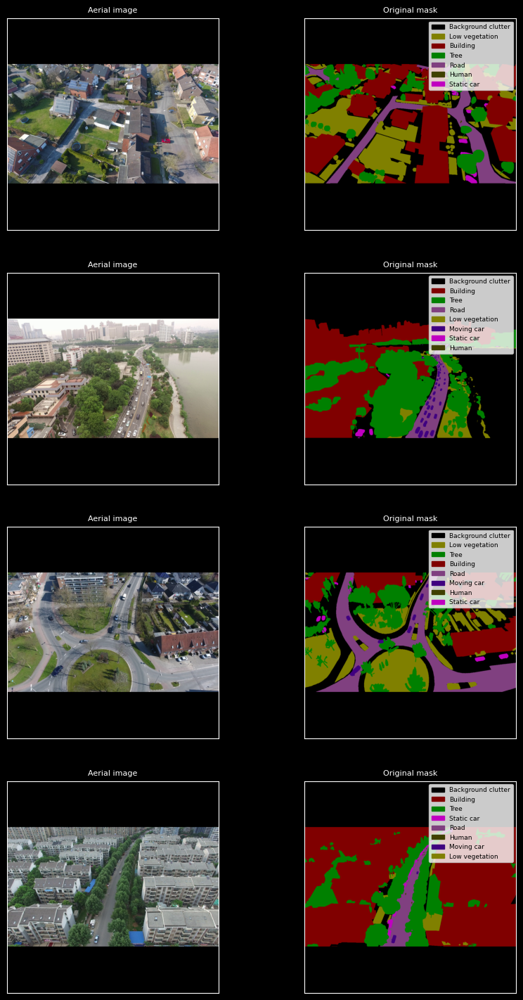

In [12]:
plot_samples("MUD", MUD_colors, df_files, size_img=size)

### Convertion table

<table>
    <tr><th>MUD categories</th><th>SSAI categories</th></tr>
    <tr><td>Building</td><td>Building</td></tr>
    <tr><td>Road</td><td>Road</td></tr>
    <tr><td>Tree</td><td>Vegetation</td></tr>
    <tr><td>Low Vegetation</td><td>Vegetation</td></tr>
    <tr><td>Moving car</td><td>Object</td></tr>
    <tr><td>Static car</td><td>Object</td></tr>
    <tr><td>Human</td><td>Object</td></tr>
    <tr><td>Background clutter</td><td>Unlabeled</td></tr>
</table>

In [13]:
MUD_colors["Convertion"] = [get_color_baseline("Unlabeled"),
                            get_color_baseline("Building"),
                            get_color_baseline("Road"),
                            get_color_baseline("Vegetation"),
                            get_color_baseline("Vegetation"),
                            get_color_baseline("Object"),
                            get_color_baseline("Object"),
                            get_color_baseline("Object")]
MUD_colors

,Classes,Color_RGB,Convertion
0,Background clutter,"(0, 0, 0)","(0, 0, 0)"
1,Building,"(128, 0, 0)","(60, 16, 152)"
2,Road,"(128, 64, 128)","(110, 193, 228)"
3,Tree,"(0, 128, 0)","(254, 221, 58)"
4,Low vegetation,"(128, 128, 0)","(254, 221, 58)"
5,Moving car,"(64, 0, 128)","(232, 98, 60)"
6,Static car,"(192, 0, 192)","(232, 98, 60)"
7,Human,"(64, 64, 0)","(232, 98, 60)"


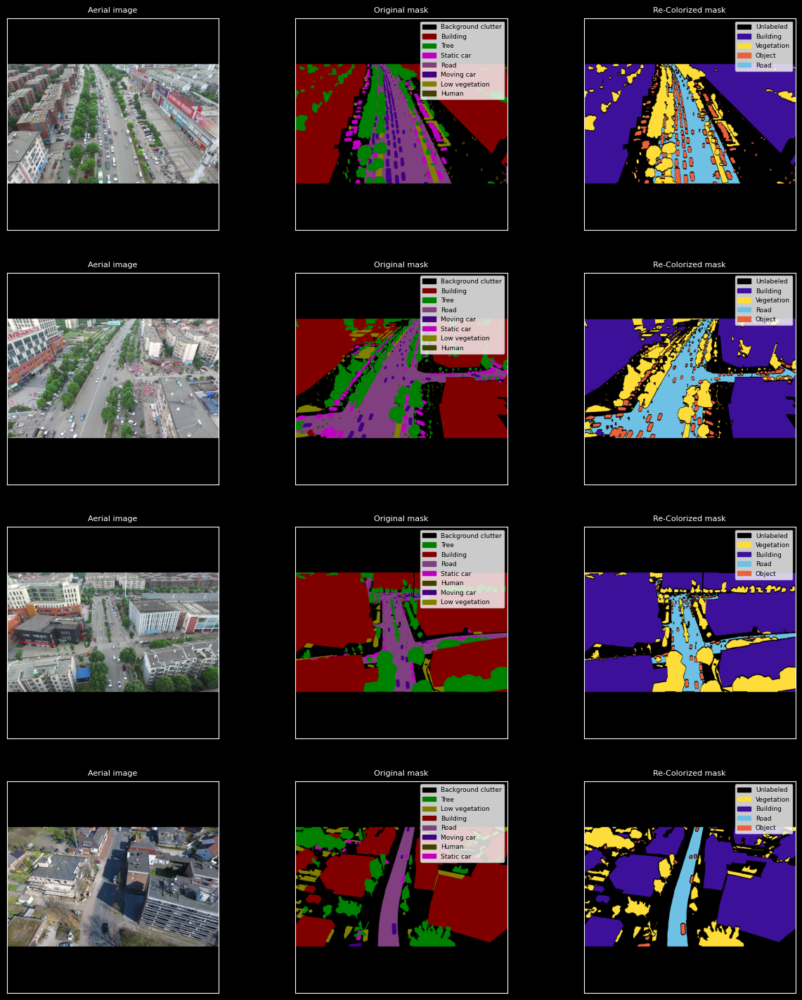

In [14]:
plot_samples("MUD", MUD_colors, df_files, norm=True, df_colors_conv=SSAI_colors, w_disp=15, size_img=size)

## Semantic Segmentation Drone Dataset

In [15]:
seg_classes = ["Background",
            "Obstacles",
            "Water",
            "Soft Surfaces",
            "Moving Objects",
            "Landing Zones"]

color_rgb = [(0, 0, 0),
            (155, 38, 182),
            (14, 135, 204),
            (124, 252, 0),
            (255, 20, 147),
            (169, 169, 169)]

color_rgb = [tuple(np.array(color)) for color in color_rgb]

SSDD_colors = pd.DataFrame(data={"Classes": seg_classes, "Color_RGB": color_rgb})
SSDD_colors

,Classes,Color_RGB
0,Background,"(0, 0, 0)"
1,Obstacles,"(155, 38, 182)"
2,Water,"(14, 135, 204)"
3,Soft Surfaces,"(124, 252, 0)"
4,Moving Objects,"(255, 20, 147)"
5,Landing Zones,"(169, 169, 169)"


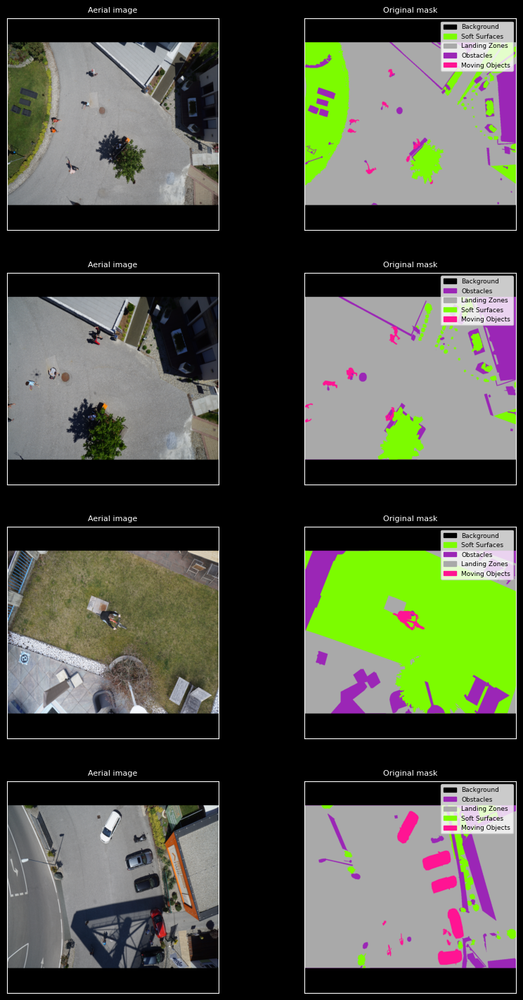

In [16]:
plot_samples("SSDD", SSDD_colors, df_files, size_img=size)

### Convertion table

<table>
    <tr><th>SSDD categories</th><th>SSAI categories</th></tr>
    <tr><td>Background</td><td>Unlabeled</td></tr>
    <tr><td>Obstacles</td><td>Object</td></tr>
    <tr><td>Water</td><td>Water</td></tr>
    <tr><td>Soft Surfaces</td><td>Vegetation</td></tr>
    <tr><td>Moving Objects</td><td>Object</td></tr>
    <tr><td>Landing Zones</td><td>Land</td></tr>
</table>

In [17]:
SSDD_colors["Convertion"] = [get_color_baseline("Unlabeled"),
                            get_color_baseline("Object"),
                            get_color_baseline("Water"),
                            get_color_baseline("Vegetation"),
                            get_color_baseline("Object"),
                            get_color_baseline("Land"),
                           ]
SSDD_colors

,Classes,Color_RGB,Convertion
0,Background,"(0, 0, 0)","(0, 0, 0)"
1,Obstacles,"(155, 38, 182)","(232, 98, 60)"
2,Water,"(14, 135, 204)","(226, 169, 41)"
3,Soft Surfaces,"(124, 252, 0)","(254, 221, 58)"
4,Moving Objects,"(255, 20, 147)","(232, 98, 60)"
5,Landing Zones,"(169, 169, 169)","(132, 41, 246)"


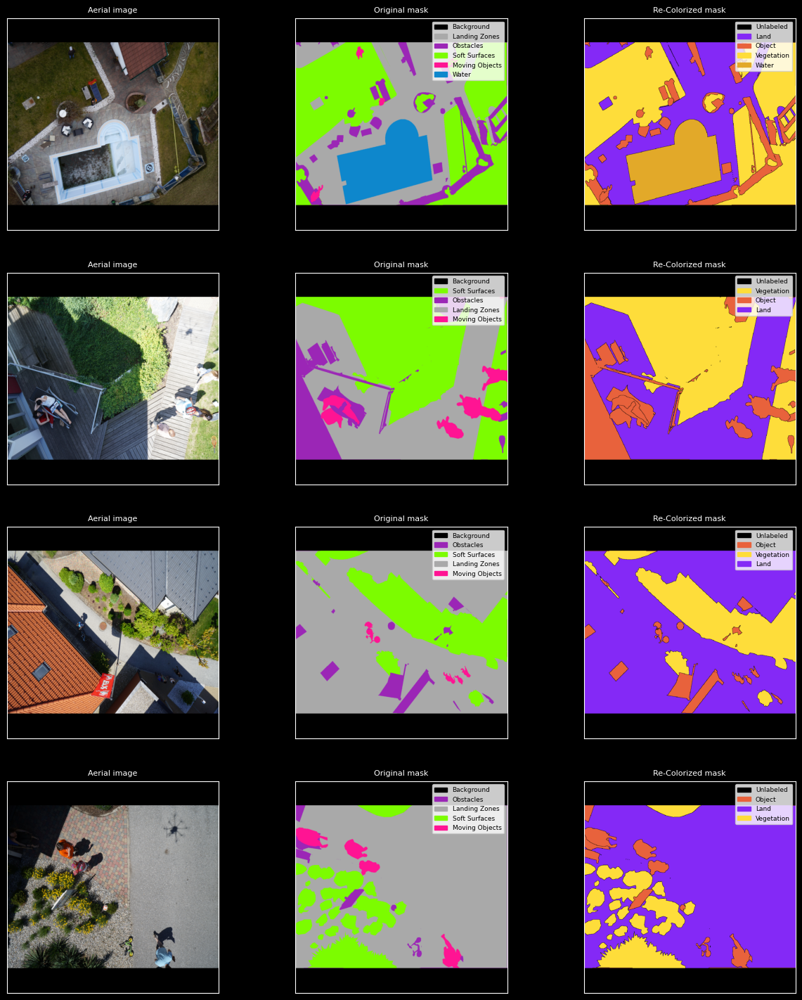

In [18]:
plot_samples("SSDD", SSDD_colors, df_files, norm=True, df_colors_conv=SSAI_colors, w_disp=15, size_img=size)

## Gaofen-2 satellite images - Five Billion Pixels

In [19]:
seg_classes = ["Background",
            "Industrial Land",
            "Paddy Field",
            "Irrigated Land",
            "Dry Cropland",
            "Garden Land",
            "Arbor Woodland",
            "Shrub Land",
            "Park",
            "Natural Meadow",
            "Artificial Meadow",
            "River",
            "Urban Residential",
            "Lake",
            "Pond",
            "Fish Pond",
            "Snow",
            "Bareland",
            "Rural Residential",
            "Stadium",
            "Square",
            "Road",
            "Overpass",
            "Railway Station",
            "Airport"]

color_bgr = [(0, 0, 0),
            (200, 0, 0),
            (0, 200, 0),
            (150, 250, 0),
            (150, 200, 150),
            (200, 0, 200),
            (150, 0, 250),
            (150, 150, 250),
            (200, 150, 200),
            (250, 200, 0),
            (200, 200, 0),
            (0, 0, 200),
            (250, 0, 150),
            (0, 150, 200),
            (0, 200, 250),
            (150, 200, 250),
            (250, 250, 250),
            (200, 200, 200),
            (200, 150, 150),
            (250, 200, 150),
            (150, 150, 0),
            (250, 150, 150),
            (250, 150, 0),
            (250, 200, 250),
            (200, 150, 0)]

color_bgr = np.array([np.array(color) for color in color_bgr])

color_rgb = np.stack([color_bgr[..., 2], color_bgr[..., 1], color_bgr[..., 0]], axis=-1)
color_rgb = [tuple(np.array(color)) for color in color_rgb]

FBP_colors = pd.DataFrame(data={"Classes": seg_classes, "Color_RGB": color_rgb})
FBP_colors

,Classes,Color_RGB
0,Background,"(0, 0, 0)"
1,Industrial Land,"(0, 0, 200)"
2,Paddy Field,"(0, 200, 0)"
3,Irrigated Land,"(0, 250, 150)"
4,Dry Cropland,"(150, 200, 150)"
5,Garden Land,"(200, 0, 200)"
6,Arbor Woodland,"(250, 0, 150)"
7,Shrub Land,"(250, 150, 150)"
8,Park,"(200, 150, 200)"
9,Natural Meadow,"(0, 200, 250)"


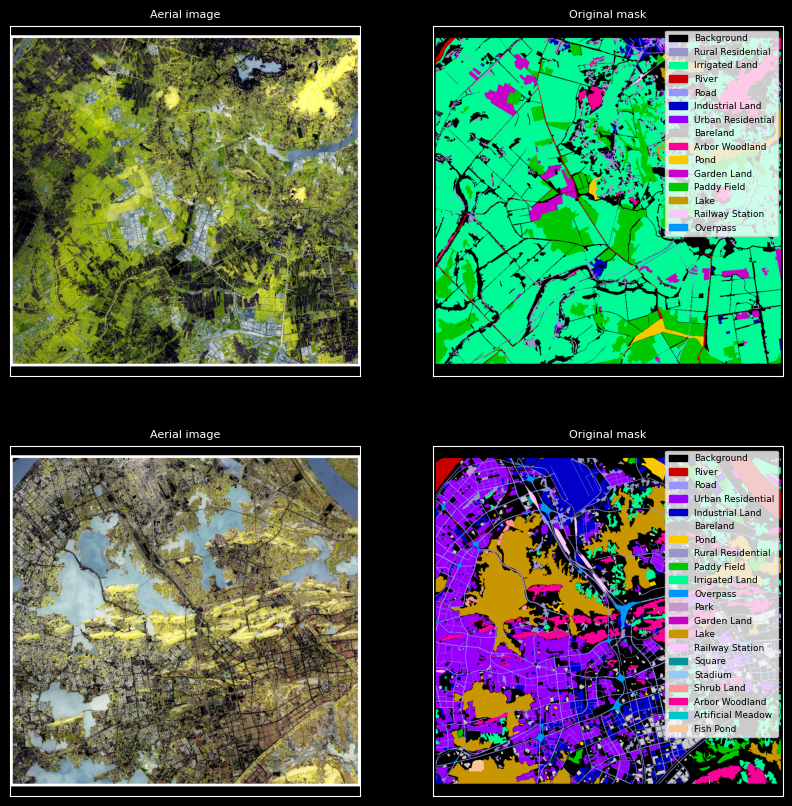

In [20]:
plot_samples("FBP", FBP_colors, df_files, num_img=2, h_disp=10, size_img=size)

### Convertion table

<table>
    <tr><th>FBP categories</th><th>SSAI categories</th></tr>
    <tr><td>Background</td><td>Unlabeled</td></tr>
    <tr><td>Industrial Land</td><td>Building</td></tr>
    <tr><td>Paddy Field</td><td>Vegetation</td></tr>
    <tr><td>Irrigated Land</td><td>Vegetation</td></tr>
    <tr><td>Dry Cropland</td><td>Vegetation</td></tr>
    <tr><td>Garden Land</td><td>Vegetation</td></tr>
    <tr><td>Arbor Woodland</td><td>Vegetation</td></tr>
    <tr><td>Shrub Land</td><td>Vegetation</td></tr>
    <tr><td>Park</td><td>Land</td></tr>
    <tr><td>Natural Meadow</td><td>Vegetation</td></tr>
    <tr><td>Artificial Meadow</td><td>Vegetation</td></tr>
    <tr><td>River</td><td>Water</td></tr>
    <tr><td>Urban Residential</td><td>Building</td></tr>
    <tr><td>Lake</td><td>Water</td></tr>
    <tr><td>Pond</td><td>Water</td></tr>
    <tr><td>Fish Pond</td><td>Water</td></tr>
    <tr><td>Snow</td><td>Water</td></tr>
    <tr><td>Bareland</td><td>Land</td></tr>
    <tr><td>Rural Residential</td><td>Building</td></tr>
    <tr><td>Stadium</td><td>Building</td></tr>
    <tr><td>Square</td><td>Building</td></tr>
    <tr><td>Road</td><td>Road</td></tr>
    <tr><td>Overpass</td><td>Road</td></tr>
    <tr><td>Railway Station</td><td>Road</td></tr>
    <tr><td>Airport</td><td>Building</td></tr>
</table>

In [21]:
FBP_colors["Convertion"] = [get_color_baseline("Unlabeled"),
                            get_color_baseline("Building"),
                            get_color_baseline("Vegetation"),
                            get_color_baseline("Vegetation"),
                            get_color_baseline("Vegetation"),
                            get_color_baseline("Vegetation"),
                            get_color_baseline("Vegetation"),
                            get_color_baseline("Vegetation"),
                            get_color_baseline("Land"),
                            get_color_baseline("Vegetation"),
                            get_color_baseline("Vegetation"),
                            get_color_baseline("Water"),
                            get_color_baseline("Building"),
                            get_color_baseline("Water"),
                            get_color_baseline("Water"),
                            get_color_baseline("Water"),
                            get_color_baseline("Water"),
                            get_color_baseline("Land"),
                            get_color_baseline("Building"),
                            get_color_baseline("Building"),
                            get_color_baseline("Building"),
                            get_color_baseline("Road"),
                            get_color_baseline("Road"),
                            get_color_baseline("Road"),
                            get_color_baseline("Building")]

FBP_colors

,Classes,Color_RGB,Convertion
0,Background,"(0, 0, 0)","(0, 0, 0)"
1,Industrial Land,"(0, 0, 200)","(60, 16, 152)"
2,Paddy Field,"(0, 200, 0)","(254, 221, 58)"
3,Irrigated Land,"(0, 250, 150)","(254, 221, 58)"
4,Dry Cropland,"(150, 200, 150)","(254, 221, 58)"
5,Garden Land,"(200, 0, 200)","(254, 221, 58)"
6,Arbor Woodland,"(250, 0, 150)","(254, 221, 58)"
7,Shrub Land,"(250, 150, 150)","(254, 221, 58)"
8,Park,"(200, 150, 200)","(132, 41, 246)"
9,Natural Meadow,"(0, 200, 250)","(254, 221, 58)"


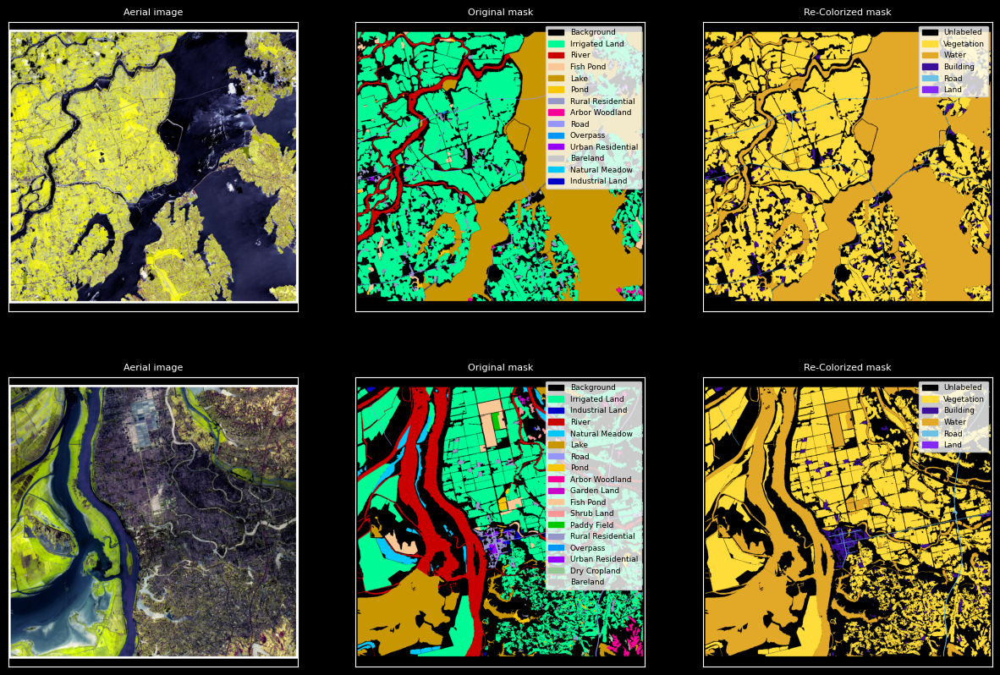

In [22]:
plot_samples("FBP", FBP_colors, df_files, num_img=2, w_disp=15, h_disp=10, norm=True, df_colors_conv=SSAI_colors, size_img=size)

## Land Cover Classification : Bhuvan Satellite Data

In [23]:
seg_classes = ["Background",
            "Urban",
            "Water",
            "Forest",
            "Agriculture",
            "Road"]

color_rgb = [(0, 0, 0),
             (0, 255, 255),
             (0, 0, 255),
             (0, 255, 0),
             (255, 255, 0),
             (255, 0, 255)]

SIM_colors = pd.DataFrame(data={"Classes": seg_classes, "Color_RGB": [tuple(np.array(color)) for color in color_rgb]})
SIM_colors

,Classes,Color_RGB
0,Background,"(0, 0, 0)"
1,Urban,"(0, 255, 255)"
2,Water,"(0, 0, 255)"
3,Forest,"(0, 255, 0)"
4,Agriculture,"(255, 255, 0)"
5,Road,"(255, 0, 255)"


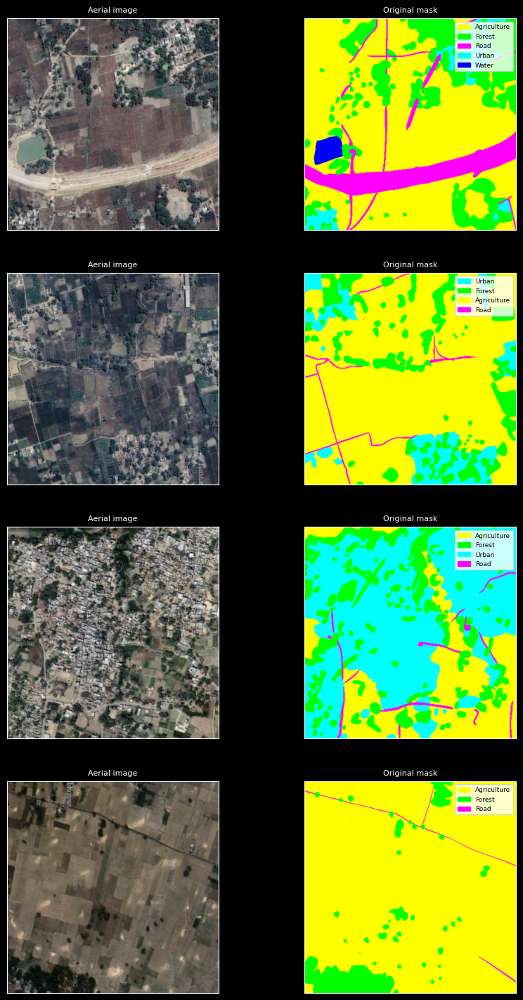

In [24]:
plot_samples("SIM", SIM_colors, df_files, size_img=size)

### Convertion table

<table>
    <tr><th>SIM categories</th><th>SSAI categories</th></tr>
    <tr><td>Background</td><td>Unlabeled</td></tr>
    <tr><td>Urban</td><td>Building</td></tr>
    <tr><td>Water</td><td>Water</td></tr>
    <tr><td>Forest</td><td>Vegetation</td></tr>
    <tr><td>Agriculture</td><td>Vegetation</td></tr>
    <tr><td>Road</td><td>Road</td></tr>
</table>

In [25]:
SIM_colors["Convertion"] = [get_color_baseline("Unlabeled"),
                            get_color_baseline("Building"),
                            get_color_baseline("Water"),
                            get_color_baseline("Vegetation"),
                            get_color_baseline("Vegetation"),
                            get_color_baseline("Road")]

SIM_colors

,Classes,Color_RGB,Convertion
0,Background,"(0, 0, 0)","(0, 0, 0)"
1,Urban,"(0, 255, 255)","(60, 16, 152)"
2,Water,"(0, 0, 255)","(226, 169, 41)"
3,Forest,"(0, 255, 0)","(254, 221, 58)"
4,Agriculture,"(255, 255, 0)","(254, 221, 58)"
5,Road,"(255, 0, 255)","(110, 193, 228)"


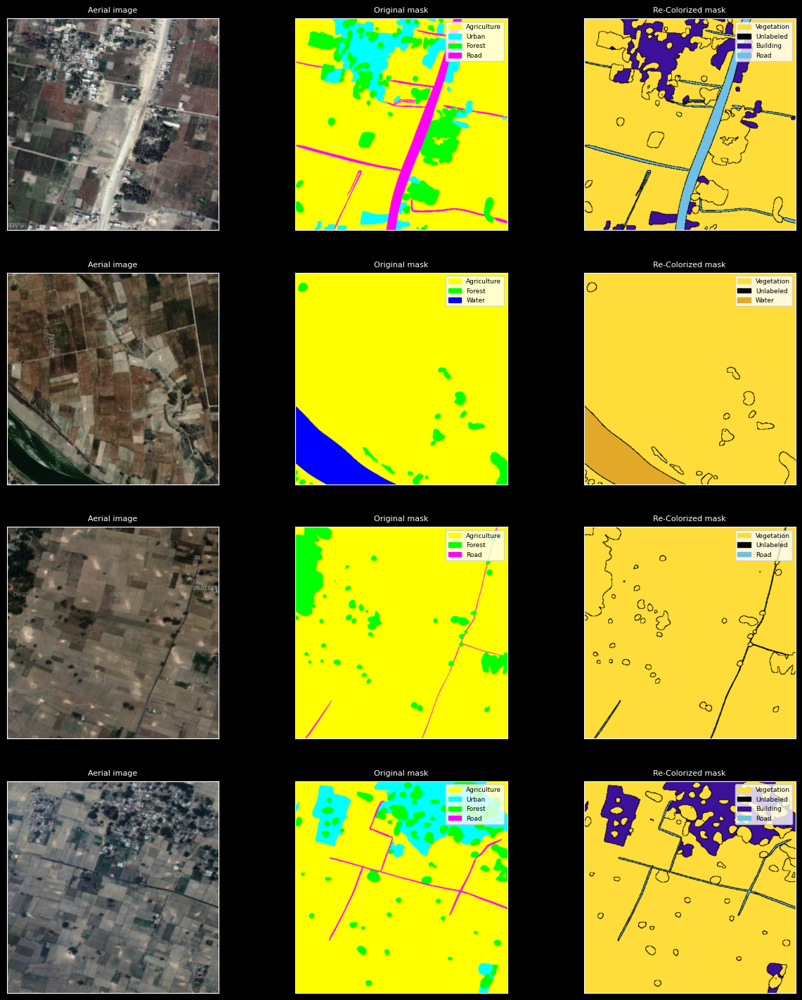

In [26]:
plot_samples("SIM", SIM_colors, df_files, w_disp=15, norm=True, df_colors_conv=SSAI_colors, size_img=size)

## Urban Segmentation - ISPRS

In [27]:
seg_classes = ["Background",
            "Clutter/background",
            "Impervious surfaces",
            "Building",
            "Low vegetation",
            "Tree",
            "Car"]

color_bgr = [(0, 0, 0),
             (255, 0, 0),
             (255, 255, 255),
             (0, 0, 255),
             (0, 255, 255),
             (0, 255, 0),
             (255, 255, 0)]

color_bgr = np.array([np.array(color) for color in color_bgr])

color_rgb = np.stack([color_bgr[..., 2], color_bgr[..., 1], color_bgr[..., 0]], axis=-1)
color_rgb = [tuple(np.array(color)) for color in color_rgb]

ISPRS_colors = pd.DataFrame(data={"Classes": seg_classes, "Color_RGB": color_rgb})
ISPRS_colors

,Classes,Color_RGB
0,Background,"(0, 0, 0)"
1,Clutter/background,"(0, 0, 255)"
2,Impervious surfaces,"(255, 255, 255)"
3,Building,"(255, 0, 0)"
4,Low vegetation,"(255, 255, 0)"
5,Tree,"(0, 255, 0)"
6,Car,"(0, 255, 255)"


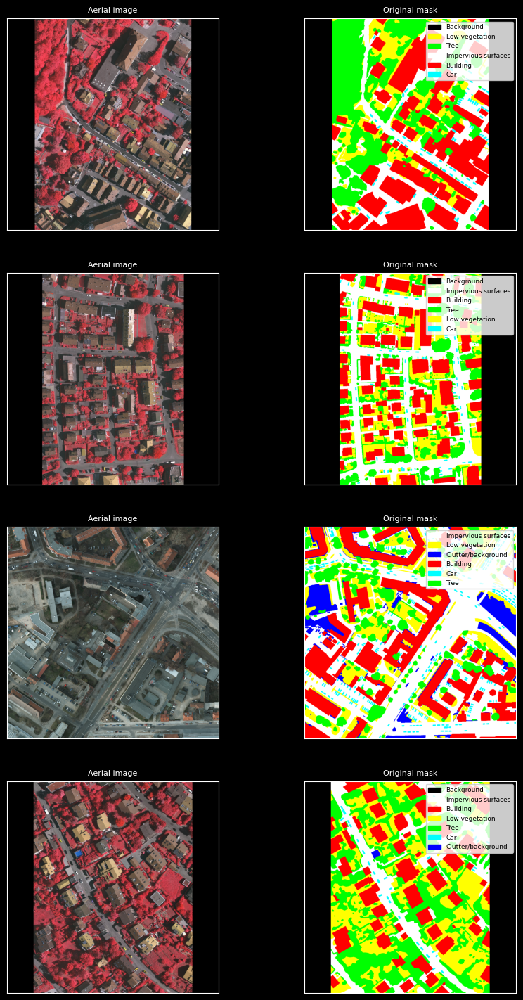

In [28]:
plot_samples("ISPRS", ISPRS_colors, df_files, size_img=size)

### Convertion table

<table>
    <tr><th>ISPRS categories</th><th>SSAI categories</th></tr>
    <tr><td>Background</td><td>Unlabeled</td></tr>
    <tr><td>Clutter/background</td><td>Building</td></tr>
    <tr><td>Impervious surfaces</td><td>Road</td></tr>
    <tr><td>Building</td><td>Building</td></tr>
    <tr><td>Low vegetation</td><td>Vegetation</td></tr>
    <tr><td>Tree</td><td>Vegetation</td></tr>
    <tr><td>Car</td><td>Object</td></tr>
</table>

In [29]:
ISPRS_colors["Convertion"] = [get_color_baseline("Unlabeled"),
                              get_color_baseline("Building"),
                              get_color_baseline("Road"),
                              get_color_baseline("Building"),
                              get_color_baseline("Vegetation"),
                              get_color_baseline("Vegetation"),
                              get_color_baseline("Object")]

ISPRS_colors

,Classes,Color_RGB,Convertion
0,Background,"(0, 0, 0)","(0, 0, 0)"
1,Clutter/background,"(0, 0, 255)","(60, 16, 152)"
2,Impervious surfaces,"(255, 255, 255)","(110, 193, 228)"
3,Building,"(255, 0, 0)","(60, 16, 152)"
4,Low vegetation,"(255, 255, 0)","(254, 221, 58)"
5,Tree,"(0, 255, 0)","(254, 221, 58)"
6,Car,"(0, 255, 255)","(232, 98, 60)"


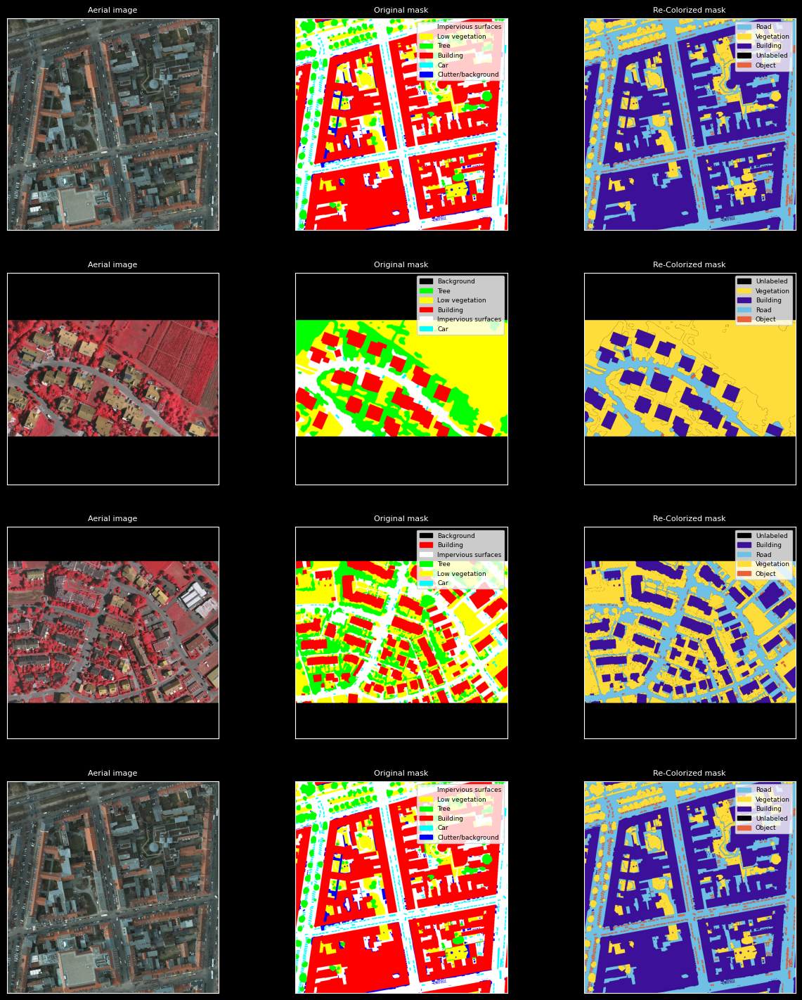

In [30]:
plot_samples("ISPRS", ISPRS_colors, df_files, w_disp=15, norm=True, df_colors_conv=SSAI_colors, size_img=size)

## Swiss Drone and Okutama Drone Datasets

In [31]:
seg_classes = ["Background",
            "Outdoor structures",
            "Buildings",
            "Paved ground",
            "Non-paved ground",
            "Train tracks",
            "Plants",
            "Wheeled vehicles",
            "Water",
            "People"]

base = np.array([1, 1, 1])

color_rgb = [tuple(i*base) for i in range(len(seg_classes))]

re_color_rgb = [(0, 0, 0),
                (237, 237, 237),
                (181, 0, 0),
                (135, 135, 135),
                (189, 107, 0),
                (128, 0, 128),
                (31, 123, 22),
                (6, 0, 130),
                (0, 168, 255),
                (240, 255, 0)]

SO_colors = pd.DataFrame(data={"Classes": seg_classes, "Color_RGB": color_rgb, "Re-Color": re_color_rgb})
SO_colors

,Classes,Color_RGB,Re-Color
0,Background,"(0, 0, 0)","(0, 0, 0)"
1,Outdoor structures,"(1, 1, 1)","(237, 237, 237)"
2,Buildings,"(2, 2, 2)","(181, 0, 0)"
3,Paved ground,"(3, 3, 3)","(135, 135, 135)"
4,Non-paved ground,"(4, 4, 4)","(189, 107, 0)"
5,Train tracks,"(5, 5, 5)","(128, 0, 128)"
6,Plants,"(6, 6, 6)","(31, 123, 22)"
7,Wheeled vehicles,"(7, 7, 7)","(6, 0, 130)"
8,Water,"(8, 8, 8)","(0, 168, 255)"
9,People,"(9, 9, 9)","(240, 255, 0)"


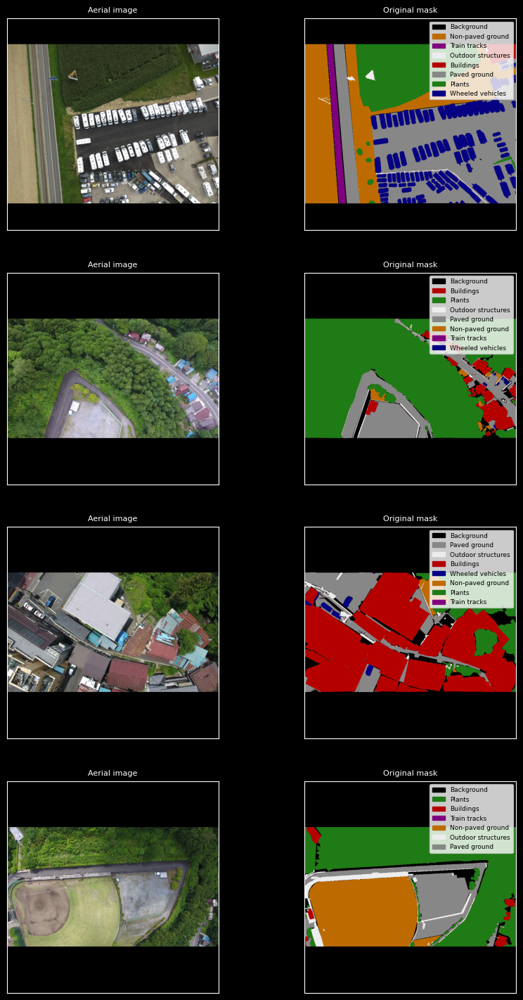

In [32]:
plot_samples("SO", SO_colors, df_files, size_img=size)

### Convertion table

<table>
    <tr><th>SO categories</th><th>SSAI categories</th></tr>
    <tr><td>Background</td><td>Unlabeled</td></tr>
    <tr><td>Outdoor structures</td><td>Object</td></tr>
    <tr><td>Buildings</td><td>Building</td></tr>
    <tr><td>Paved ground</td><td>Road</td></tr>
    <tr><td>Non-paved ground</td><td>Land</td></tr>
    <tr><td>Train tracks</td><td>Road</td></tr>
    <tr><td>Plants</td><td>Vegetation</td></tr>
    <tr><td>Wheeled vehicles</td><td>Object</td></tr>
    <tr><td>Water</td><td>Water</td></tr>
    <tr><td>People</td><td>Object</td></tr>
</table>

In [33]:
SO_colors["Convertion"] = [get_color_baseline("Unlabeled"),
                          get_color_baseline("Object"),
                          get_color_baseline("Building"),
                          get_color_baseline("Road"),
                          get_color_baseline("Land"),
                          get_color_baseline("Road"),
                          get_color_baseline("Vegetation"),
                          get_color_baseline("Object"),
                          get_color_baseline("Water"),
                          get_color_baseline("Object"),]

SO_colors

,Classes,Color_RGB,Re-Color,Convertion
0,Background,"(0, 0, 0)","(0, 0, 0)","(0, 0, 0)"
1,Outdoor structures,"(1, 1, 1)","(237, 237, 237)","(232, 98, 60)"
2,Buildings,"(2, 2, 2)","(181, 0, 0)","(60, 16, 152)"
3,Paved ground,"(3, 3, 3)","(135, 135, 135)","(110, 193, 228)"
4,Non-paved ground,"(4, 4, 4)","(189, 107, 0)","(132, 41, 246)"
5,Train tracks,"(5, 5, 5)","(128, 0, 128)","(110, 193, 228)"
6,Plants,"(6, 6, 6)","(31, 123, 22)","(254, 221, 58)"
7,Wheeled vehicles,"(7, 7, 7)","(6, 0, 130)","(232, 98, 60)"
8,Water,"(8, 8, 8)","(0, 168, 255)","(226, 169, 41)"
9,People,"(9, 9, 9)","(240, 255, 0)","(232, 98, 60)"


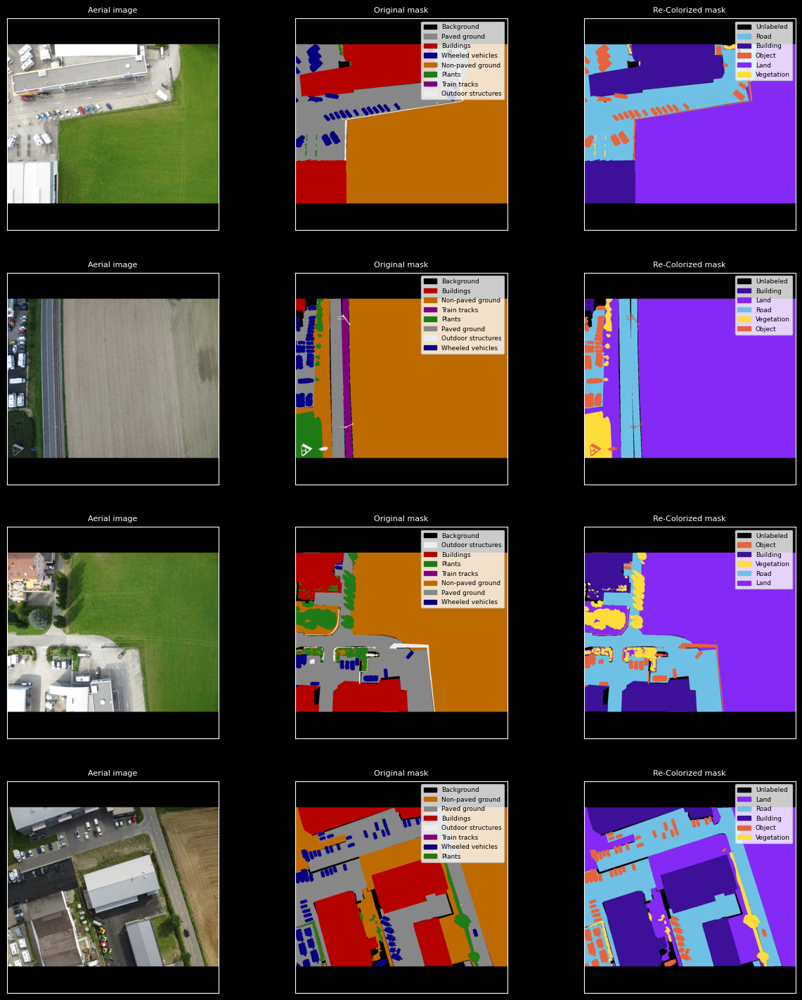

In [34]:
plot_samples("SO", SO_colors, df_files, w_disp=15, norm=True, df_colors_conv=SSAI_colors, size_img=size)

# Joining the datasets

In [35]:
num_classes = len(SSAI_colors)-1
num_classes

7

In [36]:
list_abb = list(set(dt_abb))
list_abb.sort()
list_abb

['FBP', 'ISPRS', 'MUD', 'SIM', 'SO', 'SSAI', 'SSDD']

In [37]:
palettes = dict(zip(list_abb, [FBP_colors, ISPRS_colors, MUD_colors, SIM_colors, SO_colors, SSAI_colors, SSDD_colors]))

In [38]:
def normalize_image(image, mask, abb, palettes, size_img):
    df_colors = palettes[abb]
    if abb == "ISPRS":
        image = image[..., ::-1]
    image, mask = resize_image(image, mask, size_img, padding=False)
    mask_norm = norm_colors(mask, df_colors["Color_RGB"], df_colors["Convertion"])
    return image, mask_norm

def createTFRecord(dataset, palettes, size_img):
    writer = tf.io.TFRecordWriter(dst_path+"my_dataset.tfrecord")
        
    for index, row in dataset.iterrows():
        image = load_img(row.filename_image)
        mask = load_img(row.filename_mask)
        image, mask = normalize_image(image=image, mask=mask, abb=row.dataset_abb, palettes=palettes, size_img=size_img)
        image_data, mask_data = image.numpy().tobytes(), mask.numpy().tobytes()
        example = tf.train.Example(features=tf.train.Features(feature={
            'image': tf.train.Feature(bytes_list=tf.train.BytesList(value=[image_data])),
            'mask': tf.train.Feature(bytes_list=tf.train.BytesList(value=[mask_data])),
            'shape': tf.train.Feature(int64_list=tf.train.Int64List(value=tf.shape(image))),
        }))
        
        writer.write(example.SerializeToString())
    return 

def parse(feature):
    features = tf.io.parse_single_example(
        feature,
        features={
        'image': tf.io.FixedLenFeature([], tf.string),
        'mask': tf.io.FixedLenFeature([], tf.string),
        'shape': tf.io.VarLenFeature(tf.int64),
    })
    shape = tf.sparse.to_dense(features['shape'])
    image = tf.reshape(tf.io.decode_raw(features['image'], out_type=tf.uint8), shape=(shape[0], shape[1], 3))
    mask = tf.reshape(tf.io.decode_raw(features['mask'], out_type=tf.uint8), shape=(shape[0], shape[1], 3))
    return image, mask

autotune = tf.data.AUTOTUNE
create_tensorflow_record = False

if create_tensorflow_record == True:
    createTFRecord(df_files, palettes, size_img=size)

dataset = tf.data.TFRecordDataset(dst_path+"my_dataset.tfrecord")
dataset = dataset.map(parse, num_parallel_calls=autotune)

NotFoundError: {{function_node __wrapped__IteratorGetNext_output_types_2_device_/job:localhost/replica:0/task:0/device:CPU:0}} /kaggle/working/my_dataset.tfrecord; No such file or directory [Op:IteratorGetNext] name: 

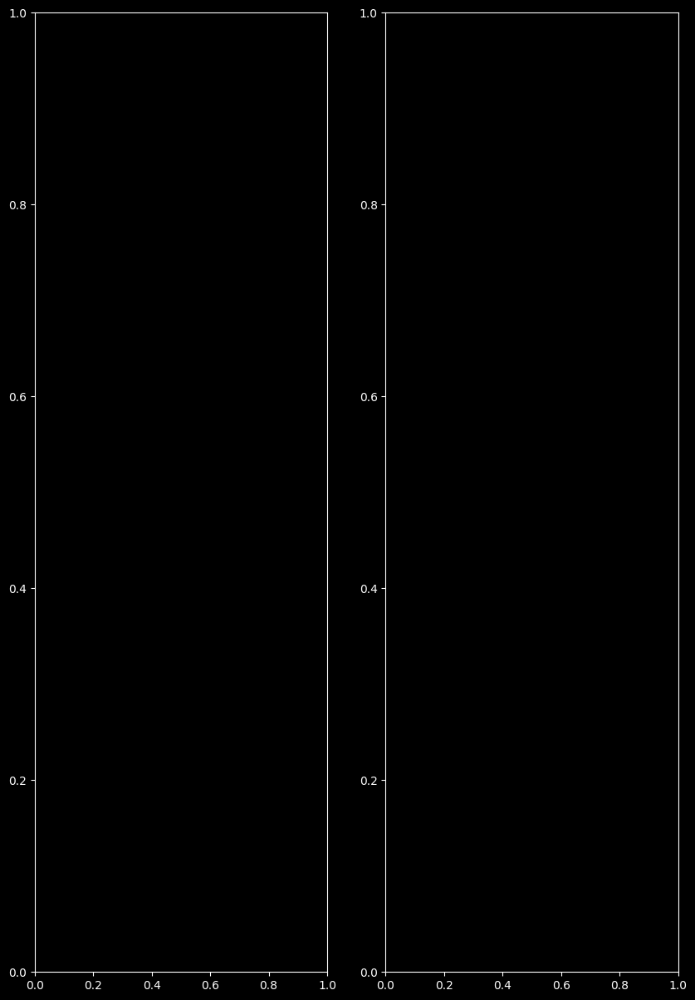

In [39]:
plt.subplots(1, 2, figsize=(10, 15))
for image, mask in dataset.shuffle(100).take(1):
    plot_sample(image, mask, SSAI_colors)

In [ ]:
df_count = SSAI_colors.iloc[:-1][["Classes", "Color_HEX"]].copy()
df_count["Pixels"] = 0
df_count["Images"] = 0

total_pixels = 0
for image, mask in dataset:
    colors, _, counts = tf.raw_ops.UniqueWithCountsV2(x=tf.reshape(mask, (-1, 3)), axis=[0])
    for color, count in zip(colors, counts):
        color = tuple(color.numpy())
        df_count.loc[df_count["Classes"] == get_classes_baseline(color), "Pixels"] += count.numpy()
    df_count.loc[df_count["Classes"] == get_classes_baseline(color), "Images"] += 1

In [ ]:
df_count

In [ ]:
import seaborn as sns

plt.figure(figsize=(15, 4))

df_count = df_count.sort_values("Pixels", ascending=False)
ax = sns.barplot(df_count, y="Classes", x=df_count["Pixels"]/df_count.Pixels.sum(), palette=df_count["Color_HEX"], edgecolor="gray")
ax.set_xlabel("% [Pixels/Total of pixels]")
ax.bar_label(ax.containers[0], fontsize=10, fmt='%0.3f%%')
ax.set_title("Amount of Pixels per Class");

In [ ]:
plt.figure(figsize=(15, 4))

df_count = df_count.sort_values("Images", ascending=False)
ax = sns.barplot(df_count, y="Classes", x=df_count["Images"]/df_count.Images.sum(), palette=df_count["Color_HEX"], edgecolor="gray")
ax.set_xlabel("% [Images/Total of images]")
ax.bar_label(ax.containers[0], fontsize=10, fmt='%0.3f%%')
ax.set_title("Amount of Images per Class");

# Splitting dataset

In [ ]:
dataset_size = len(df_files)
dataset = dataset.shuffle(dataset_size+1, seed=42)

train_size = np.ceil(0.7 * dataset_size).astype(np.int32)
test_size = np.floor(0.3 * dataset_size).astype(np.int32)
val_size = test_size = int(0.5 * test_size)

train_dataset = dataset.take(train_size)
test_dataset = dataset.skip(train_size)
val_dataset = test_dataset.skip(val_size)
test_dataset = test_dataset.take(test_size)

train_size, test_size, val_size

# Data augmentation

In [ ]:
plt.subplots(1, 2, figsize=(10, 15))
for image, mask in train_dataset.shuffle(100).take(1):
    plot_sample(image, mask, SSAI_colors)

In [ ]:
import albumentations as A

def transform_image(image, mask):
    transform = A.Compose([
        A.RandomCrop(width=512, height=512, p=0.5),
        A.HorizontalFlip(p=0.5),
        A.VerticalFlip(p=0.5),
        A.RandomBrightnessContrast(p=0.5),
        A.RandomRotate90(p=0.5),
        A.ShiftScaleRotate(shift_limit=0.2, scale_limit=0.2, rotate_limit=30, p=0.5),
        A.RGBShift(r_shift_limit=25, g_shift_limit=25, b_shift_limit=25, p=0.5),
        #A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
    ])
    transformed = transform(image=image, mask=mask)
    return transformed['image'], transformed['mask']

n_img = 4
plt.subplots(n_img, 2, figsize=(10, 15))
for i in range(n_img):
    transformed_image, transformed_mask = transform_image(image.numpy(), mask.numpy())
    
    idx = (i*2)
    plot_sample(transformed_image, transformed_mask, SSAI_colors, num_img=n_img, ind=idx)
    
plt.tight_layout()

In [ ]:
def augment(image, mask):
    return transform_image(image, mask)

def data_augmentation(image, mask):
    image, mask = tf.numpy_function(func=augment, inp=[image, mask], Tout=[tf.uint8, tf.uint8])
    image, mask = resize_image(image, mask, size_img, padding=True)
    return image, mask

size_img = 512
train_dataset_augment = train_dataset.map(data_augmentation, num_parallel_calls=autotune)

plt.subplots(1, 2, figsize=(10, 15))
for image_, mask_ in train_dataset_augment.shuffle(100).take(1):
    plot_sample(image_, mask_, SSAI_colors)

# U-Net Architecture from scratch

Reference: [U-Net: Convolutional Networks for Biomedical Image Segmentation](http://https://arxiv.org/abs/1505.04597)

![U-Net Architecture](https://i.ibb.co/93m575V/Sin-t-tulo.png)

## Encoder
![Encoder](https://i.ibb.co/yp1svTD/Encoder.png)


### How to calculate output size of convolution layers?
When padding parameters is setting to "same":
The spatial size of the output volume is a function of the input volume size **W**, the kernel field size 
**K** of the convolutional layer neurons, the stride **S**, and the amount of zero padding **P** on the border. The number of neurons that "fit" in a given volume is then:

$\frac{W - K - 2P}{S} + 1$

When padding parameters is setting to "same":

The output has the same size as the input

### How to calculate output size of pooling layers?
The resulting output, when using the "**valid**" padding option, has a spatial shape of:

$ Floor(\frac{W - K}{S}) + 1 $

Where K defined by pool_size.

But the resulting output shape when using the "**same**" padding option is:

$ Floor(\frac{W - 1}{S}) + 1 $

In [ ]:
from keras.layers import Conv2D, MaxPooling2D, UpSampling2D
from keras.layers import Input, add, concatenate
from keras.models import Model

input_layer = Input(shape = (512, 512, 3), name="unet_input")
encoder = Conv2D(filters=64, kernel_size=(3, 3), activation="relu", padding='same', strides=(1, 1), name="en_block1_conv1")(input_layer) #padding='same', output_size = (512, 512, 64)
encoder = Conv2D(filters=64, kernel_size=(3, 3), activation="relu", padding='same', strides=(1, 1), name="en_block1_conv2")(encoder) #padding='same', output_size = (512, 512, 64)
block1_output = encoder

encoder = MaxPooling2D(pool_size=(2, 2), strides=(2, 2), name="block1_mxp")(encoder) #W=512, K=2, S=2, output_size = (256, 256, 64)

encoder = Conv2D(filters=128, kernel_size=(3, 3), activation="relu", padding='same', strides=(1, 1), name="en_block2_conv1")(encoder) #padding='same', output_size = (256, 256, 128)
encoder = Conv2D(filters=128, kernel_size=(3, 3), activation="relu", padding='same', strides=(1, 1), name="en_block2_conv2")(encoder) #padding='same', output_size = (256, 256, 128)
block2_output = encoder

encoder = MaxPooling2D(pool_size=(2, 2), strides=(2, 2), name="block2_mxp")(encoder) #W=256, K=2, S=2, output_size = (128, 128, 128)

encoder = Conv2D(filters=256, kernel_size=(3, 3), activation="relu", padding='same', strides=(1, 1), name="en_block3_conv1")(encoder) #padding='same', output_size = (128, 128, 256)
encoder = Conv2D(filters=256, kernel_size=(3, 3), activation="relu", padding='same', strides=(1, 1), name="en_block3_conv2")(encoder) #padding='same', output_size = (128, 128, 256)
block3_output = encoder

encoder = MaxPooling2D(pool_size=(2, 2), strides=(2, 2), name="block3_mxp")(encoder) #W=128, K=2, S=2, output_size = (64, 64, 256)

encoder = Conv2D(filters=512, kernel_size=(3, 3), activation="relu", padding='same', strides=(1, 1), name="en_block4_conv1")(encoder) #padding='same', output_size = (64, 64, 512)
encoder = Conv2D(filters=512, kernel_size=(3, 3), activation="relu", padding='same', strides=(1, 1), name="en_block4_conv2")(encoder) #padding='same', output_size = (64, 64, 512)
block4_output = encoder

encoder_output = MaxPooling2D(pool_size=(2, 2), strides=(2, 2), name="en_block4_mxp")(encoder) #W=64, K=2, S=2, output_size = (32, 32, 512)

## Bottleneck

![Bottleneck](https://i.ibb.co/K9gpwPG/Bottleneck.png)

### How to calculate output size of upsampling layers?

$ W_{ouput} = W_{input} * size[0]$

$ H_{ouput} = H_{input} * size[1]$

In [ ]:
bottleneck = Conv2D(filters=32, kernel_size=(3, 3), activation="relu", padding='same', strides=(1, 1), name="btn_conv1")(encoder_output) #padding='same', output_size = (32, 32, 32)
bottleneck = Conv2D(filters=1024, kernel_size=(3, 3), activation="relu", padding='same', strides=(1, 1), name="btn_conv2")(bottleneck) #padding='same', output_size = (32, 32, 1024)

bottleneck_output = UpSampling2D(size=(2, 2), data_format=None, interpolation="nearest", name="btn_output")(bottleneck) #input=(32, 32, 1024), size=(2, 2). output_size = (64, 64, 1024)

## Decoder

![Decoder](https://i.ibb.co/xjzZBv2/Sin-t-tulo3.png)

In [ ]:
decoder = Conv2D(filters=1024, kernel_size=(3, 3), activation="relu", padding='same', strides=(1, 1), name="de_block1_conv1")(bottleneck_output) #padding='same', output_size = (64, 64, 1024)
decoder = concatenate([block4_output, decoder])
decoder = Conv2D(filters=512, kernel_size=(3, 3), activation="relu", padding='same', strides=(1, 1), name="de_block1_conv2")(decoder) #padding='same', output_size = (64, 64, 512)

decoder = UpSampling2D(size=(2, 2), data_format=None, interpolation="nearest", name="de_block1_up")(decoder) #input=(64, 64, 512), size=(2, 2). output_size = (128, 128, 1024)

decoder = Conv2D(filters=512, kernel_size=(3, 3), activation="relu", padding='same', strides=(1, 1), name="de_block2_conv1")(decoder) #padding='same', output_size = (128, 128, 512)
decoder = concatenate([block3_output, decoder])
decoder = Conv2D(filters=256, kernel_size=(3, 3), activation="relu", padding='same', strides=(1, 1), name="de_block2_conv2")(decoder) #padding='same', output_size = (128, 128, 256)

decoder = UpSampling2D(size=(2, 2), data_format=None, interpolation="nearest", name="de_block2_up")(decoder) #input=(128, 128, 512), size=(2, 2). output_size = (256, 256, 256)

decoder = Conv2D(filters=256, kernel_size=(3, 3), activation="relu", padding='same', strides=(1, 1), name="de_block3_conv1")(decoder) #padding='same', output_size = (256, 256, 256)
decoder = concatenate([block2_output, decoder])
decoder = Conv2D(filters=128, kernel_size=(3, 3), activation="relu", padding='same', strides=(1, 1), name="de_block3_conv2")(decoder) #padding='same', output_size = (256, 256, 128)

decoder = UpSampling2D(size=(2, 2), data_format=None, interpolation="nearest", name="de_block3_up")(decoder) #input=(256, 256, 512), size=(2, 2). output_size = (512, 512, 128)

decoder = Conv2D(filters=128, kernel_size=(3, 3), activation="relu", padding='same', strides=(1, 1), name="de_block4_conv1")(decoder) #padding='same', output_size = (512, 512, 128)
decoder = concatenate([block1_output, decoder])
decoder = Conv2D(filters=64, kernel_size=(3, 3), activation="relu", padding='same', strides=(1, 1), name="de_block4_conv2")(decoder) #padding='same', output_size = (512, 512, 64)
decoder = Conv2D(filters=64, kernel_size=(3, 3), activation="relu", padding='same', strides=(1, 1), name="de_block4_conv3")(decoder) #padding='same', output_size = (512, 512, 64)

decoder_output = Conv2D(filters=num_classes, kernel_size=(1, 1), activation="relu", padding='same', strides=(1, 1), name="de_block4_conv4")(decoder) #padding='same', output_size = (512, 512, 7)

In [ ]:
from tensorflow.keras.utils import plot_model

unet_model = Model(inputs=[input_layer], outputs=[decoder_output])

plot_model(unet_model, show_shapes=True, show_layer_names=True, dpi=50)